KeyboardInterrupt: 

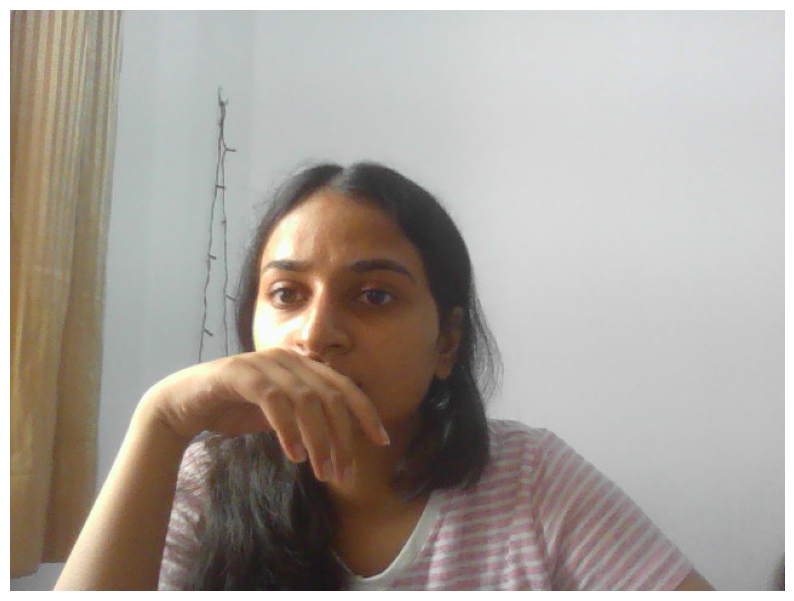

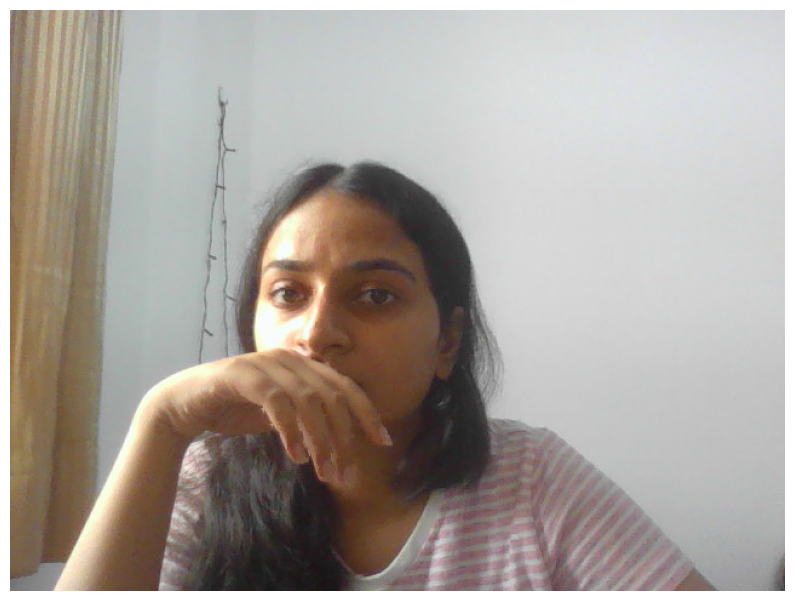

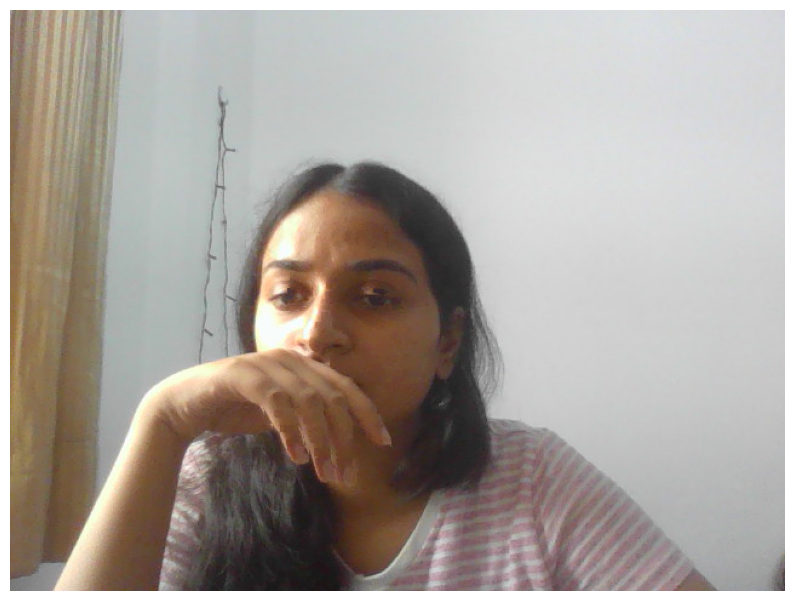

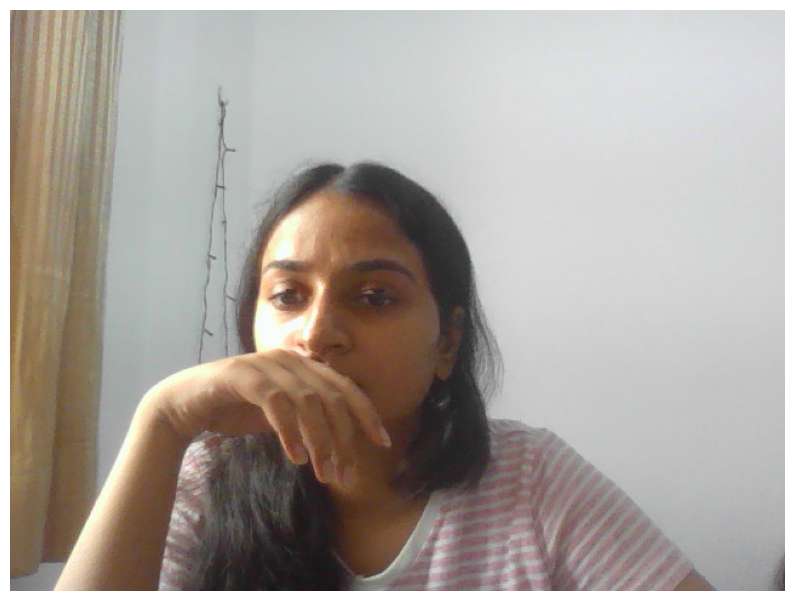

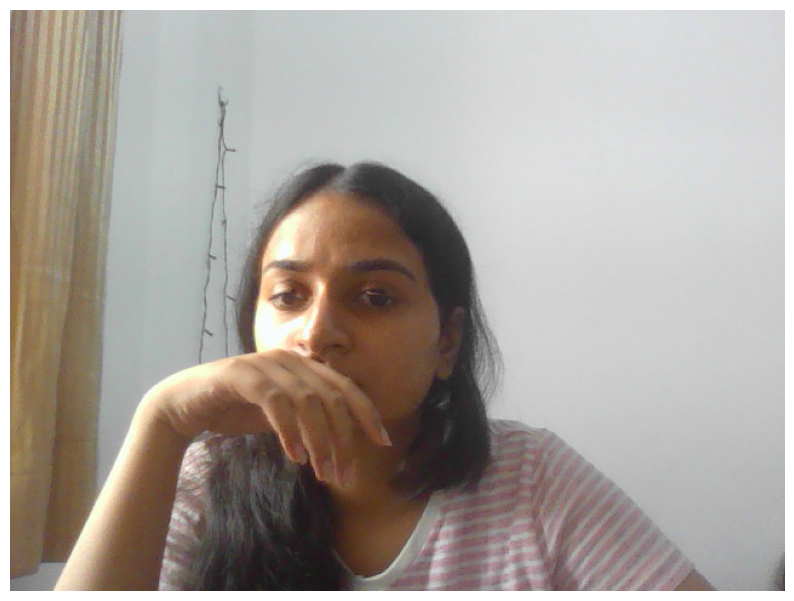

...

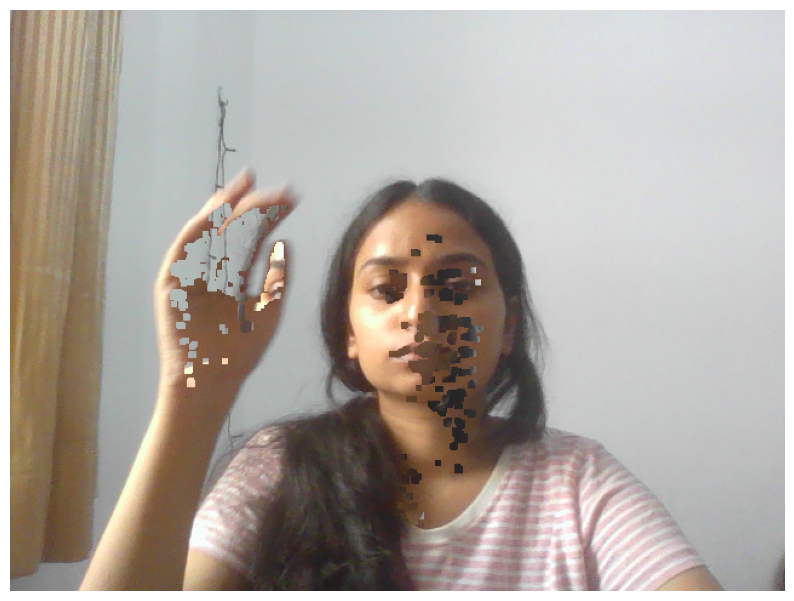

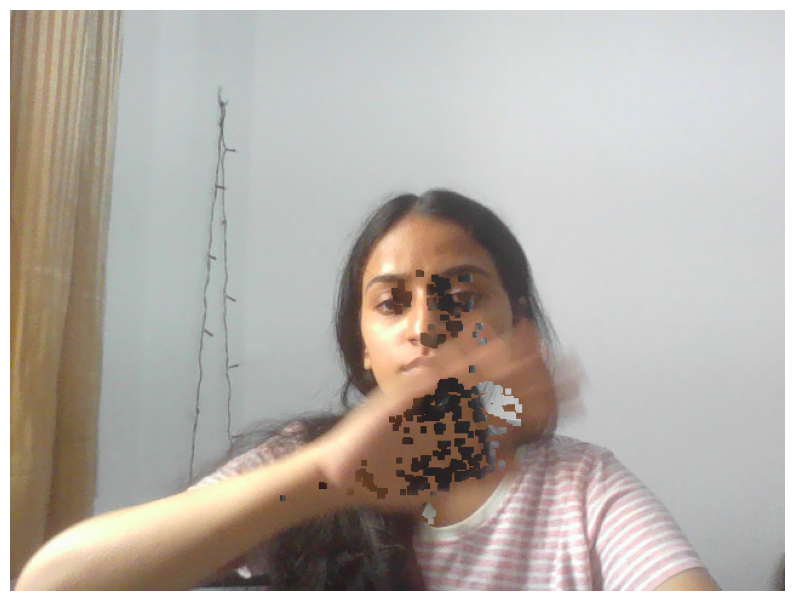

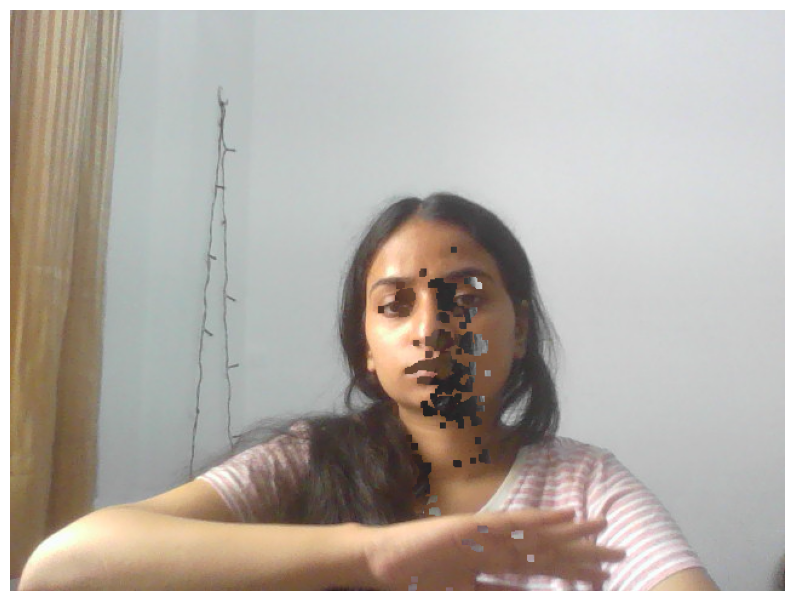

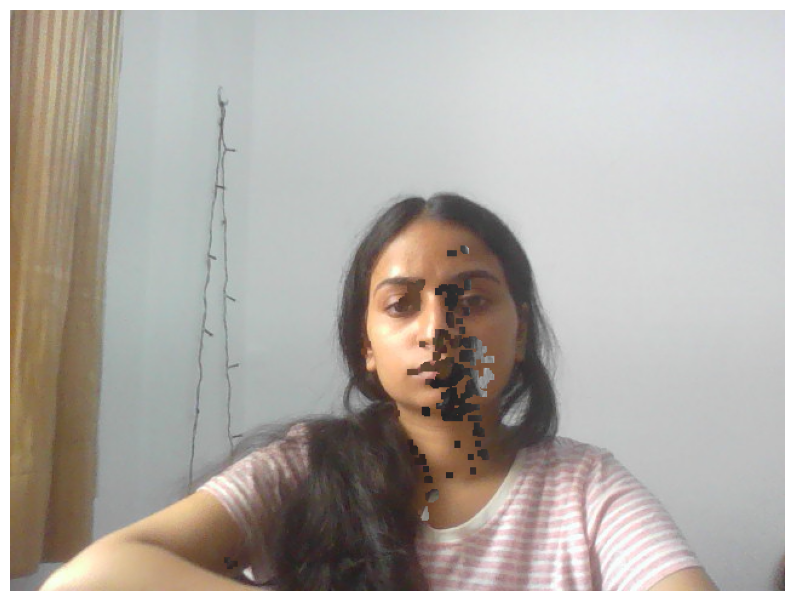

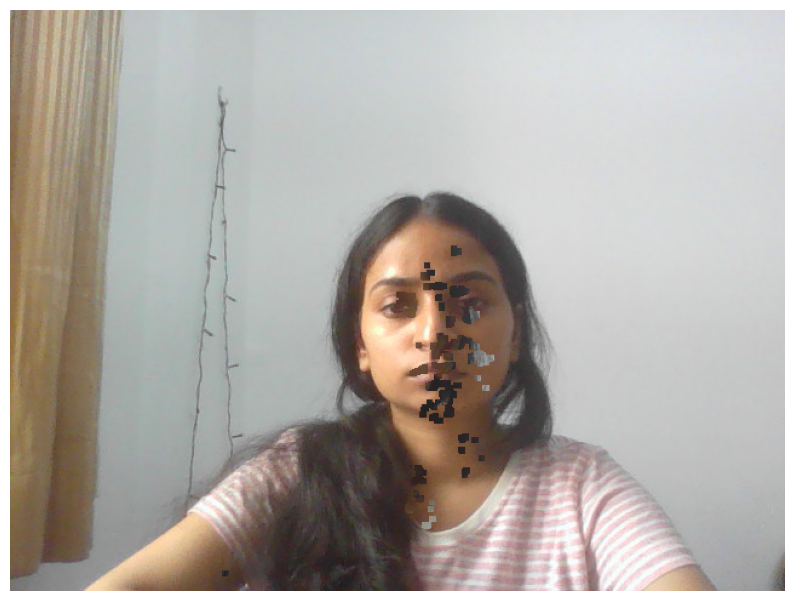

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import display, clear_output

# Initialize video capture
cap = cv2.VideoCapture(0)

# Allow the system to sleep for 3 seconds before the webcam starts
import time
time.sleep(3)

# Capture the background in a few frames
for i in range(30):
    ret, background = cap.read()
background = np.flip(background, axis=1)

def process_frame(frame, background):
    frame = np.flip(frame, axis=1)

    hsv = cv2.cvtColor(frame, cv2.COLOR_BGR2HSV)

    # Define the HSV range for the cloak color (red)
    lower_red1 = np.array([0, 120, 70])
    upper_red1 = np.array([10, 255, 255])
    mask1 = cv2.inRange(hsv, lower_red1, upper_red1)

    lower_red2 = np.array([170, 120, 70])
    upper_red2 = np.array([180, 255, 255])
    mask2 = cv2.inRange(hsv, lower_red2, upper_red2)

    mask1 = mask1 + mask2
    mask1 = cv2.morphologyEx(mask1, cv2.MORPH_OPEN, np.ones((3, 3), np.uint8))
    mask1 = cv2.morphologyEx(mask1, cv2.MORPH_DILATE, np.ones((3, 3), np.uint8))

    mask2 = cv2.bitwise_not(mask1)

    res1 = cv2.bitwise_and(frame, frame, mask=mask2)
    res2 = cv2.bitwise_and(background, background, mask=mask1)
    final_output = cv2.addWeighted(res1, 1, res2, 1, 0)

    return final_output

# Display the output
while True:
    ret, frame = cap.read()
    if not ret:
        break

    final_output = process_frame(frame, background)

    # Convert BGR to RGB for displaying
    final_output_rgb = cv2.cvtColor(final_output, cv2.COLOR_BGR2RGB)

    # Display the frame
    plt.figure(figsize=(10, 10))
    plt.imshow(final_output_rgb)
    plt.axis('off')
    display(plt.gcf())
    clear_output(wait=True)

    if cv2.waitKey(1) == ord('q'):
        break

cap.release()
cv2.destroyAllWindows()
